In [2]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from soundtypes.st_tools import make_soundtypes
import soundfile as sf
import IPython



N_COEFF = 13
SOURCE_FILE = 'soundtypes/samples/cage.wav'
TARGET_FILE = 'soundtypes/samples/lachenmann.wav'
FRAME_SIZE = 2048
HOP_SIZE = 1024
ST_RATIO = .7
K = 5
SR = 44100

In [3]:
IPython.display.Audio(SOURCE_FILE)

In [4]:
IPython.display.Audio(TARGET_FILE)

[soundtypes - timbre matching]

computing features...
computing soundtypes...
matching clusters...
generate hybridization...
saving audio data...


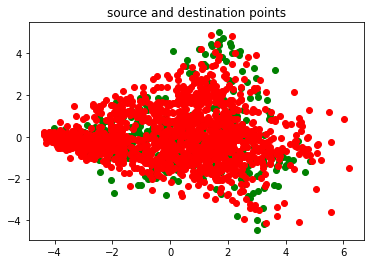

In [5]:


if __name__ == "__main__":
    print ('[soundtypes - timbre matching]\n')
    print ('computing features...')
    [y_src, sr] = librosa.core.load(SOURCE_FILE, SR)

    y_pad_src = np.zeros(len(y_src) + FRAME_SIZE)
    y_pad_src[1:len(y_src)+1] = y_src

    C_src = librosa.feature.mfcc(y=y_src, sr=sr, n_mfcc=N_COEFF, 
                                 n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    [y_dst, sr] = librosa.core.load(TARGET_FILE)
    
    y_pad_dst = np.zeros(len(y_dst) + FRAME_SIZE)
    y_pad_dst[1:len(y_dst)+1] = y_dst
    
    C_dst = librosa.feature.mfcc(y=y_dst, sr=sr, n_mfcc=N_COEFF, 
                                 n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

    C_scaled_dst = C_dst.T
    C_scaled_src = C_src.T
        
    scaler = StandardScaler ()    
    C_scaled_dst = scaler.fit_transform (C_scaled_dst)
    C_scaled_src = scaler.fit_transform (C_scaled_src)

    print ('computing soundtypes...')
    (dictionary_src, markov_src, centroids_src, labels_src) = \
        make_soundtypes(C_scaled_src, ST_RATIO)
    n_clusters_src = centroids_src.shape[0]
    (dictionary_dst, markov_dst, centroids_dst, labels_dst) = \
        make_soundtypes(C_scaled_dst, ST_RATIO)
    n_clusters_dst = centroids_dst.shape[0]
    
    print ('matching clusters...')
    knn = NearestNeighbors(K).fit (centroids_dst);
    dist, idxs = knn.kneighbors(centroids_src)
    
    print ('generate hybridization...')   
    n_frames = len(labels_src)
    gen_sound = np.zeros(n_frames * HOP_SIZE + FRAME_SIZE)
    for i in range(n_frames):
        labels_match = idxs[labels_src[i], :]
        x = labels_match[np.random.randint(K)]
        p = dictionary_dst[x]
        if len(p) == 0:
            atom = 0
        else:
            atom = p[np.random.randint(len(p))]

        amp = np.sum (np.abs(y_pad_src[i * HOP_SIZE : i * HOP_SIZE + \
            FRAME_SIZE]))
        chunk = y_pad_dst[atom * HOP_SIZE : atom * HOP_SIZE + FRAME_SIZE] \
            * np.hanning(FRAME_SIZE)

        norm = np.max (np.abs(chunk))
        if norm == 0:
            norm = 1
            
        chunk /= norm
        gen_sound[i * HOP_SIZE : i * HOP_SIZE + FRAME_SIZE] += (chunk * amp / n_frames)

    print ('saving audio data...')
    sf.write('generated_sound.wav', gen_sound, sr)  
    pca = PCA(2)
    C_scaled_dst = pca.fit_transform (C_scaled_dst)
    C_scaled_src = pca.fit_transform (C_scaled_src)
        
    plt.close ('all')

    plt.figure ()
    plt.plot (C_scaled_src[:, 0], C_scaled_src[:, 1], 'go')
    plt.plot (C_scaled_dst[:, 0], C_scaled_dst[:, 1], 'ro')
    plt.title('source and destination points')
    

In [6]:
IPython.display.Audio('generated_sound.wav')